<center><font size=6> 均值回归策略 </font></center>
目前还没完成

- 偏离度-收益 的相关关系：
    1. 计算20均值，20方差
    2. 计算偏离度指标
    3. 计算shift（）的10均价
    4. 用频数分布，热力图展示二者的相关性

In [2]:
import pandas as pd

In [3]:
# 从本地读取价量数据
binance_price_df = pd.read_csv("./data/AAVEUSDT-1m-2023-07.csv", header=None)

binance_price_df.columns = ['open_time','open','high','low','close','volume','close_time','quote_volume','count',
                    'taker_buy_volume','taker_buy_quote_volume','ignore']

price_df = binance_price_df[['close']]

In [4]:
import cufflinks 
cufflinks.set_config_file(offline_config=False)

## 计算偏离度指标
- 偏离度-收益 的相关关系：
    1. 计算20均值，20方差
    2. 计算偏离度指标
    3. 计算shift（）的10均价
    4. 用频数分布，热力图展示二者的相关性

In [5]:
Boll_df = pd.DataFrame(index=price_df.index)

Boll_df['mean_20'] = price_df[['close']].ewm(span=20, adjust=False).mean()
Boll_df['std_20'] = price_df[['close']].ewm(span=20, adjust=False).std()
Boll_df['close'] = price_df['close']

# 未来的平均价格（用于衡量收益情况）
Boll_df['mean_5_future'] = price_df[['close']].ewm(span=4, adjust=False).mean().shift(-5)
Boll_df['mean_10_future'] = price_df[['close']].ewm(span=10, adjust=False).mean().shift(-10)  # 首先计算均线，然后错位10个（也就是对应于未来的均价）
Boll_df['mean_20_future'] = price_df[['close']].ewm(span=20, adjust=False).mean().shift(-20)
Boll_df['mean_30_future'] = price_df[['close']].ewm(span=30, adjust=False).mean().shift(-30)

In [6]:
Boll_df['close_5_future'] = price_df[['close']].shift(-5) 
Boll_df['close_20_future'] = price_df[['close']].shift(-20) 

In [7]:
Boll_df.dropna(inplace=True)

In [9]:
# 计算偏离度 theta = (p - ma) / sigma
Boll_df['theta'] = (Boll_df['close'] - Boll_df['mean_20']) / Boll_df['std_20']

### 简单观察一下我们定义的偏离度指标
预期：应该呈现钟形曲线

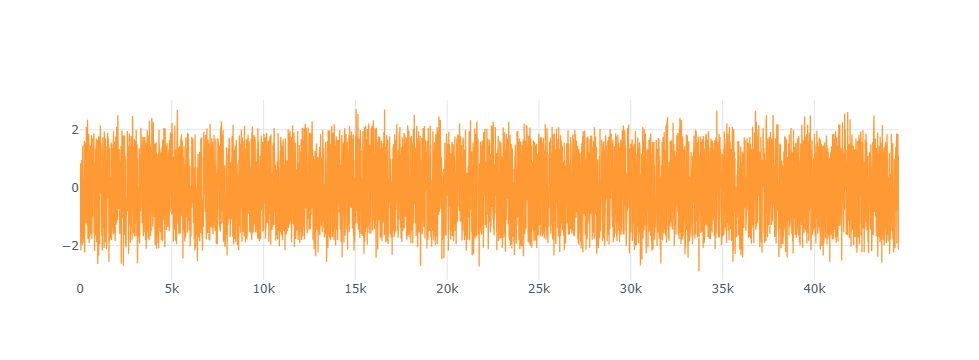

In [10]:
Boll_df['theta'].iplot()

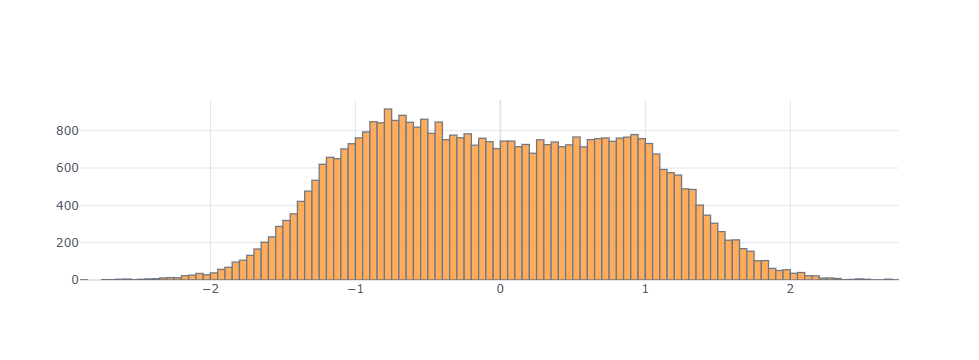

In [9]:
Boll_df['theta'].iplot(kind='hist')

### 简单观察一下预期收益 R_prospective

In [10]:
Boll_df['prospective_earnings_5_mean'] = (Boll_df['mean_5_future'] - Boll_df['close']) / Boll_df['close'] 
Boll_df['prospective_earnings_10_mean'] = (Boll_df['mean_10_future'] - Boll_df['close']) / Boll_df['close'] 
Boll_df['prospective_earnings_20_mean'] = (Boll_df['mean_20_future'] - Boll_df['close']) / Boll_df['close'] 
Boll_df['prospective_earnings_30_mean'] = (Boll_df['mean_30_future'] - Boll_df['close']) / Boll_df['close'] 

Boll_df['20_price_momentum'] = (Boll_df['close_20_future'] - Boll_df['close']) / Boll_df['close'] 
Boll_df['5_price_momentum'] = (Boll_df['close_5_future'] - Boll_df['close']) / Boll_df['close'] 


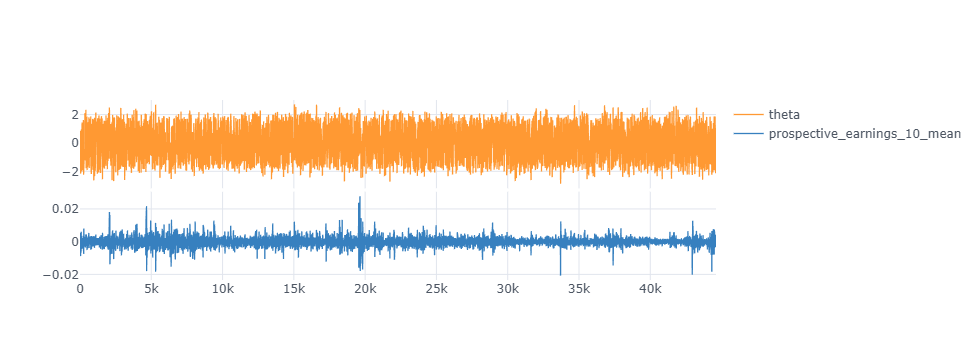

In [14]:
Boll_df[['theta','prospective_earnings_10_mean']].iplot(subplots=True,shape=(2,1),shared_xaxes=True,vertical_spacing=.02)

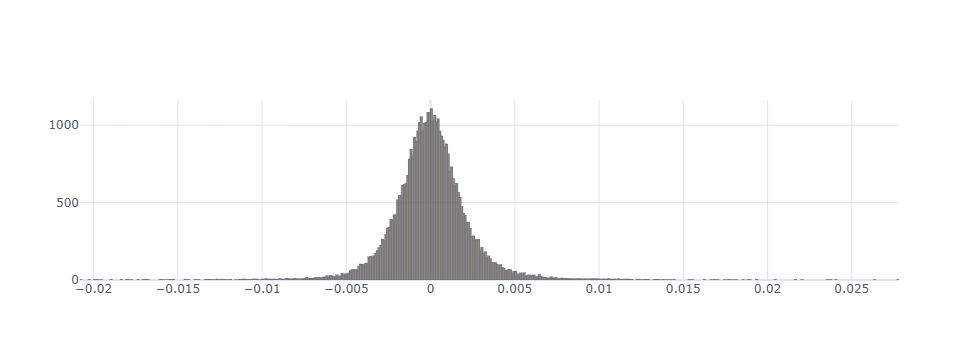

In [90]:
Boll_df['prospective_earnings_10_mean'].iplot(kind='hist')

## 观察theta与R_prospective 的联系

In [91]:
import matplotlib.pyplot as plt

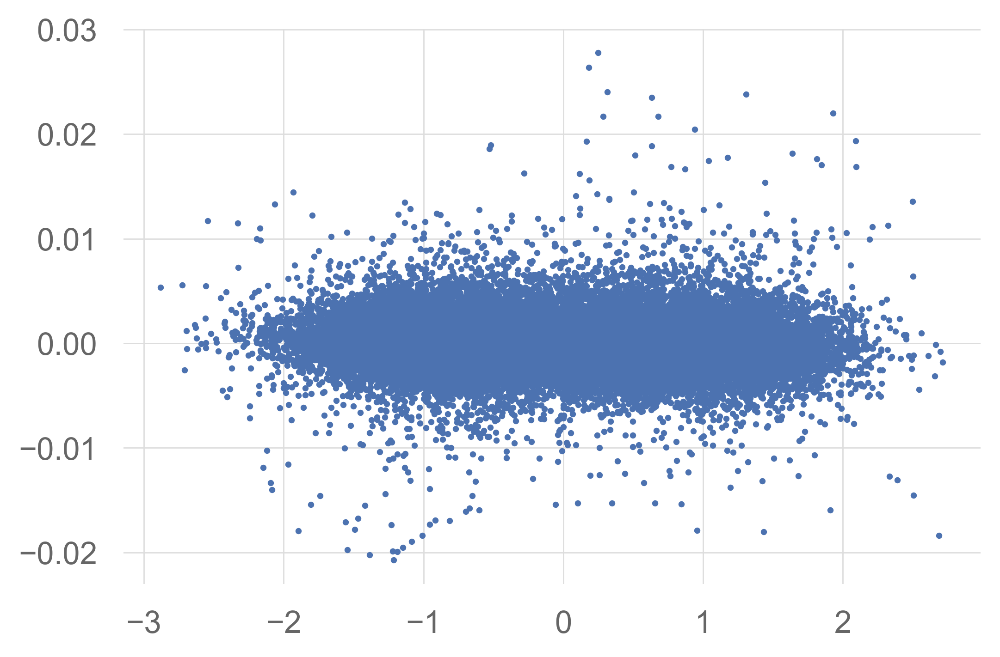

In [92]:
plt.figure(figsize=(6,4),dpi=400)
plt.scatter(x=Boll_df[['theta']], 
            y=Boll_df[['prospective_earnings_10_mean']],
            s=2)

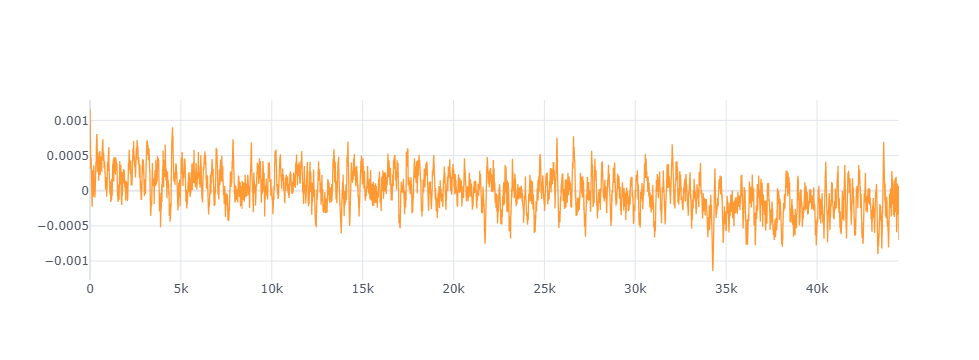

In [93]:
# 使用theta对 'prospective_earnings'进行排序得到的结果。
test = Boll_df.sort_values(by='theta')[['prospective_earnings_10_mean']].rolling(100).mean()
test.dropna(inplace=True)
test.reset_index(inplace=True, drop=True)
test.iplot()

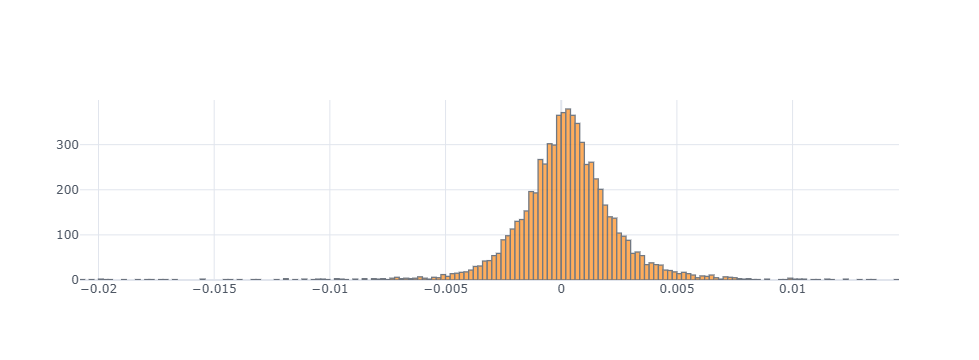

In [94]:
Boll_df[Boll_df['theta']<-1][['prospective_earnings_10_mean']].iplot('hist')

In [95]:
Boll_df[Boll_df['theta']<-2]['prospective_earnings_10_mean'].mean()

0.0006526326332473773

In [96]:
Boll_df[Boll_df['theta']<-1]['prospective_earnings_10_mean'].mean()

0.00021616906924862113

In [97]:
import numpy as np

In [98]:
-0.025399 + 2*0.896678

1.767957

In [99]:
-0.025399 - 2*0.896678

-1.818755

In [100]:
Boll_df.describe()

,mean_20,std_20,close,mean_5_future,mean_10_future,mean_20_future,mean_30_future,close_5_future,close_20_future,theta,prospective_earnings_5_mean,prospective_earnings_10_mean,prospective_earnings_20_mean,prospective_earnings_30_mean,20_price_momentum,5_price_momentum
count,44609.000000,44609.000000,44609.000000,44609.000000,44609.000000,44609.000000,44609.000000,44609.000000,44609.000000,44609.000000,44609.000000,44609.000000,44609.000000,44609.000000,44609.000000,44609.000000
mean,73.389414,0.153963,73.388284,73.387886,73.387671,73.387167,73.386667,73.387719,73.386178,-0.025295,-0.000004,-0.000005,-0.000008,-0.000012,-0.000019,-0.000005
std,3.143879,0.113069,3.151313,3.150966,3.149689,3.147847,3.145961,3.152317,3.155136,0.896757,0.001863,0.002278,0.003160,0.003864,0.004999,0.002488
min,64.368475,0.024657,64.020000,64.098107,64.220925,64.368475,64.497462,64.020000,64.020000,-2.879515,-0.022109,-0.020728,-0.027362,-0.033220,-0.049485,-0.033089
25%,71.452363,0.088051,71.440000,71.447297,71.452770,71.452363,71.457726,71.440000,71.440000,-0.751954,-0.000941,-0.001189,-0.001653,-0.001980,-0.002573,-0.001268
50%,72.915941,0.124620,72.930000,72.926549,72.922400,72.915941,72.920414,72.930000,72.930000,-0.054675,-0.000013,-0.000036,-0.000074,-0.000082,-0.000137,0.000000
75%,74.763626,0.182444,74.770000,74.765441,74.769055,74.763626,74.756771,74.770000,74.770000,0.708799,0.000898,0.001122,0.001567,0.001913,0.002444,0.001220
max,86.690055,1.576821,87.870000,87.417764,87.104985,86.690055,86.253097,87.870000,87.870000,2.714295,0.025537,0.027781,0.028049,0.031016,0.048886,0.035609


## 分层计算预期收益均值

In [101]:
threshold_list = np.arange(-3, 3., 0.5)
means_list = []

for i in range(len(threshold_list)-1):
    is_lower_threshold = Boll_df['theta'].values<threshold_list[i+1]
    is_upper_threshold = threshold_list[i]<Boll_df['theta'].values
    print(np.logical_and(is_lower_threshold, is_upper_threshold).sum())
    temp_mean = np.mean(Boll_df[np.logical_and(is_lower_threshold, is_upper_threshold)][['prospective_earnings_10_mean']])
    means_list.append(temp_mean.values)

16
165
1383
5463
8422
7631
7260
7553
5160
1384
161


<BarContainer object of 11 artists>

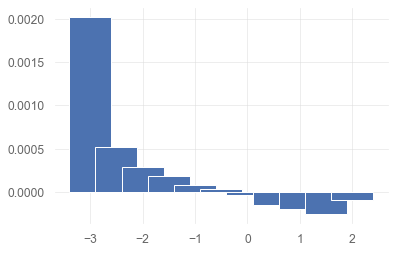

In [102]:
plt.bar(threshold_list[:-1], np.reshape(np.array(means_list), -1),)

# 3. Corr的计算
或者叫做IC

In [103]:
# 预期收益（未来20单位 均价）IC
prospective_earnings_10_mean = Boll_df[['theta','prospective_earnings_10_mean']].corr().iloc[0,1]
prospective_earnings_20_mean = Boll_df[['theta','prospective_earnings_20_mean']].corr().iloc[0,1]
prospective_earnings_30_mean = Boll_df[['theta','prospective_earnings_30_mean']].corr().iloc[0,1]

# 动量的IC
IC_20_price_momentum = Boll_df[['theta','20_price_momentum']].corr().iloc[0,1]
IC_5_price_momentum = Boll_df[['theta','5_price_momentum']].corr().iloc[0,1]

In [104]:
print('prospective_earnings_10_mean:', prospective_earnings_10_mean)
print('prospective_earnings_20_mean:', prospective_earnings_20_mean)
print('prospective_earnings_30_mean:', prospective_earnings_30_mean)

print('IC_20_price_momentum: ', IC_20_price_momentum)
print('IC_5_price_momentum: ', IC_5_price_momentum)

prospective_earnings_10_mean: -0.06284435739202976
prospective_earnings_20_mean: -0.06769818902964159
prospective_earnings_30_mean: -0.06795303862393169
IC_20_price_momentum:  0.01082159696889566
IC_5_price_momentum:  0.011681743891206776


### 分段进行IC计算，并计算方差

In [105]:
Boll_df.shape

(44609, 16)

## 3.1 IC_prospective_earnings

In [106]:
print((np.multiply(Boll_df['prospective_earnings_5_mean'].values, Boll_df['theta'].values)<0).sum()/ len(Boll_df))
print((np.multiply(Boll_df['prospective_earnings_10_mean'].values, Boll_df['theta'].values)<0).sum()/ len(Boll_df))
print((np.multiply(Boll_df['prospective_earnings_20_mean'].values, Boll_df['theta'].values)<0).sum()/ len(Boll_df))
print((np.multiply(Boll_df['prospective_earnings_30_mean'].values, Boll_df['theta'].values)<0).sum()/ len(Boll_df))

0.5081261628819297
0.5339729650967293
0.5424690084960434
0.5479611737541752


IC_mean:  -0.016514286046169488
IC_std:  0.01661024534832349
IR:  -0.9942228847231515


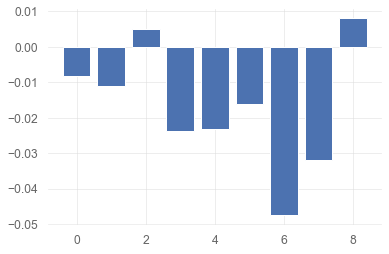

In [107]:
IC_list = []
for i in range(0,len(Boll_df),5000):
    temp_df = Boll_df.iloc[i:i+5000,:]
    temp_IC = temp_df[['theta','prospective_earnings_5_mean']].corr().iloc[0,1]
    IC_list.append(temp_IC)

plt.bar(range(len(IC_list)),IC_list)

IC_mean = np.mean(IC_list)
IC_std = np.std(IC_list)
IR = IC_mean / IC_std

print('IC_mean: ', IC_mean)
print('IC_std: ', IC_std)
print('IR: ', IR)

IC_mean:  -0.06771159839906565
IC_std:  0.021885074407619772
IR:  -3.0939624484662644


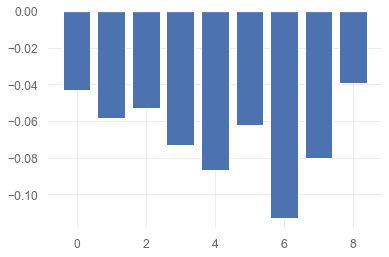

In [108]:
IC_list = []
for i in range(0,len(Boll_df),5000):
    temp_df = Boll_df.iloc[i:i+5000,:]
    temp_IC = temp_df[['theta','prospective_earnings_10_mean']].corr().iloc[0,1]
    IC_list.append(temp_IC)

plt.bar(range(len(IC_list)),IC_list)

IC_mean = np.mean(IC_list)
IC_std = np.std(IC_list)
IR = IC_mean / IC_std

print('IC_mean: ', IC_mean)
print('IC_std: ', IC_std)
print('IR: ', IR)

IC_mean:  -0.07517749119737432
IC_std:  0.028651182855989714
IR:  -2.623887871409748


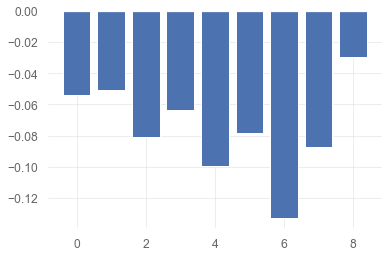

In [109]:
IC_list = []
for i in range(0,len(Boll_df),5000):
    temp_df = Boll_df.iloc[i:i+5000,:]
    temp_IC = temp_df[['theta','prospective_earnings_20_mean']].corr().iloc[0,1]
    IC_list.append(temp_IC)

plt.bar(range(len(IC_list)),IC_list)

IC_mean = np.mean(IC_list)
IC_std = np.std(IC_list)
IR = IC_mean / IC_std

print('IC_mean: ', IC_mean)
print('IC_std: ', IC_std)
print('IR: ', IR)

IC_mean:  -0.07757934920716078
IC_std:  0.0346202469920202
IR:  -2.2408664278172954


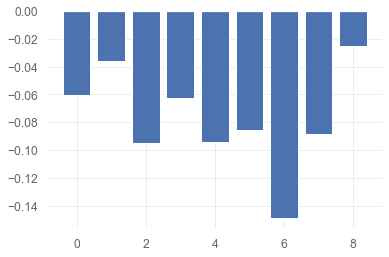

In [110]:
IC_list = []
for i in range(0,len(Boll_df),5000):
    temp_df = Boll_df.iloc[i:i+5000,:]
    temp_IC = temp_df[['theta','prospective_earnings_30_mean']].corr().iloc[0,1]
    IC_list.append(temp_IC)

plt.bar(range(len(IC_list)),IC_list)

IC_mean = np.mean(IC_list)
IC_std = np.std(IC_list)
IR = IC_mean / IC_std

print('IC_mean: ', IC_mean)
print('IC_std: ', IC_std)
print('IR: ', IR)

## 3.2 IC_20_price_momentum

In [111]:
IC_list = []
for i in range(0,len(Boll_df),5000):
    temp_df = Boll_df.iloc[i:i+5000,:]
    temp_IC = temp_df[['theta','20_price_momentum']].corr().iloc[0,1]
    IC_list.append(temp_IC)

<BarContainer object of 9 artists>

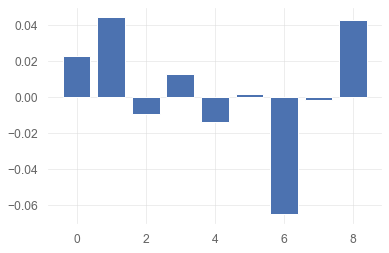

In [112]:
plt.bar(range(len(IC_list)),IC_list)

In [113]:
IC_mean = np.mean(IC_list)
IC_std = np.std(IC_list)
IR = IC_mean / IC_std

print('IC_mean: ', IC_mean)
print('IC_std: ', IC_std)
print('IR: ', IR)

IC_mean:  0.004009447049734161
IC_std:  0.03145905085653685
IR:  0.1274497144881611


## 3.3 IC_5_price_momentum

IC_mean:  0.009816480026553684
IC_std:  0.017956056960944492
IR:  0.5466946361278047


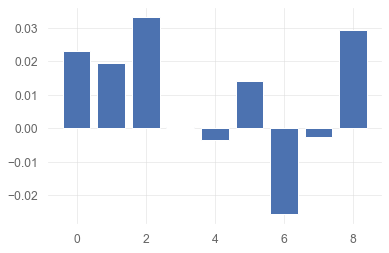

In [114]:
IC_list = []
for i in range(0,len(Boll_df),5000):
    temp_df = Boll_df.iloc[i:i+5000,:]
    temp_IC = temp_df[['theta','5_price_momentum']].corr().iloc[0,1]
    IC_list.append(temp_IC)

plt.bar(range(len(IC_list)),IC_list)

IC_mean = np.mean(IC_list)
IC_std = np.std(IC_list)
IR = IC_mean / IC_std

print('IC_mean: ', IC_mean)
print('IC_std: ', IC_std)
print('IR: ', IR)

# 凯利公式！！important

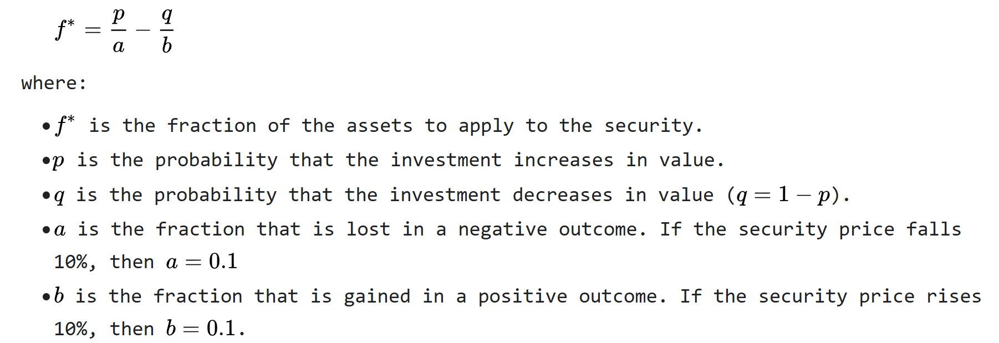

In [115]:
p = 0.55
f = p/1 - (1-p)/1